In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import random
import phate

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from External.ICT.calculate_ICT import calculate_ICT
from External.clustering import centers, k_means_pp, ICT_clusters, cfilter, cassign
from External.generation import create_graph, find_backbone
from External.plotting import plot_points, plot_graph, no_intersections
from External.reweight import reweight_clusters
from External.data_loader import data_loader

from copy import deepcopy

# from External.create_k_nearest import patch_together

plt.style.use('standard.mplstyle')

In [5]:
# Hyperparameters
mode = "K_Nearest+Density2" # Graph construction mode
ICT_algorithm = "cluster_all"
metric = "euclidean" # metric for clustering

# Cluster rassignment
min_cluster_size = 12

In [6]:
position, labels, embedding = data_loader("eth_CC", True)
dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding", False)

number_of_nodes = len(position)

# calculate the clusters
pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))

Final k: 11


calculating the densities for the density criterion:   0%|          | 0/13707 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

sklearn is done: 47.6404390335083
My own part is done: 0.3125574588775635
sklearn is done: 74.96466612815857
My own part is done: 1.5323162078857422


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

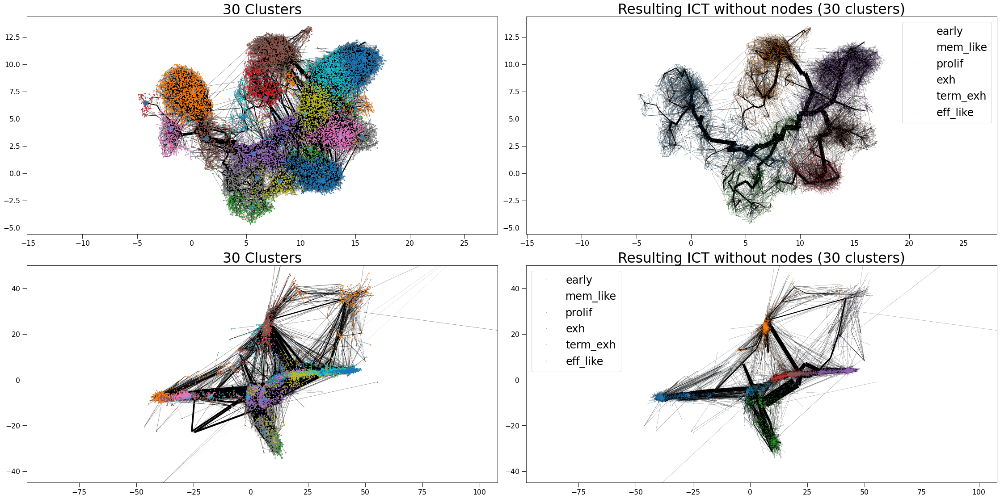

sklearn is done: 56.162208557128906
My own part is done: 0.5860409736633301
sklearn is done: 52.51564598083496
My own part is done: 1.2443735599517822


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

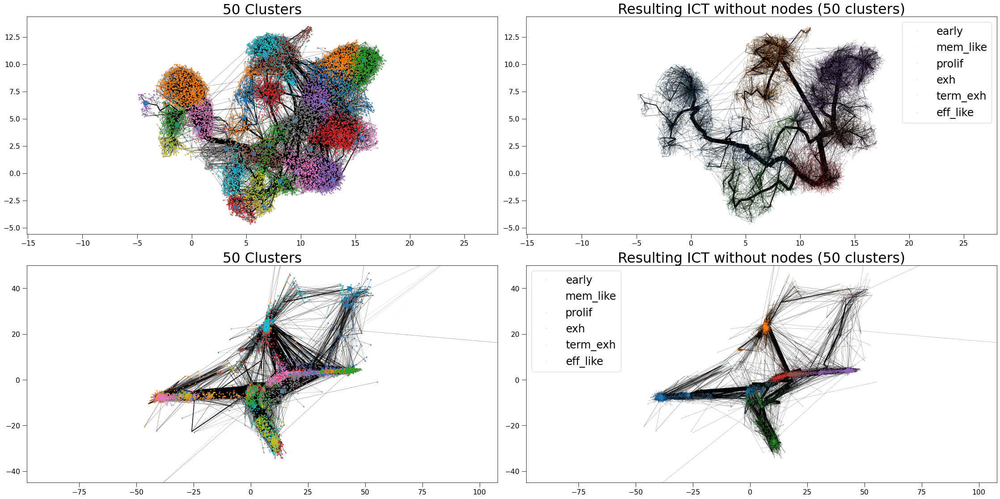

sklearn is done: 57.22888422012329
My own part is done: 0.7982399463653564
sklearn is done: 62.19937062263489
My own part is done: 2.6736392974853516


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

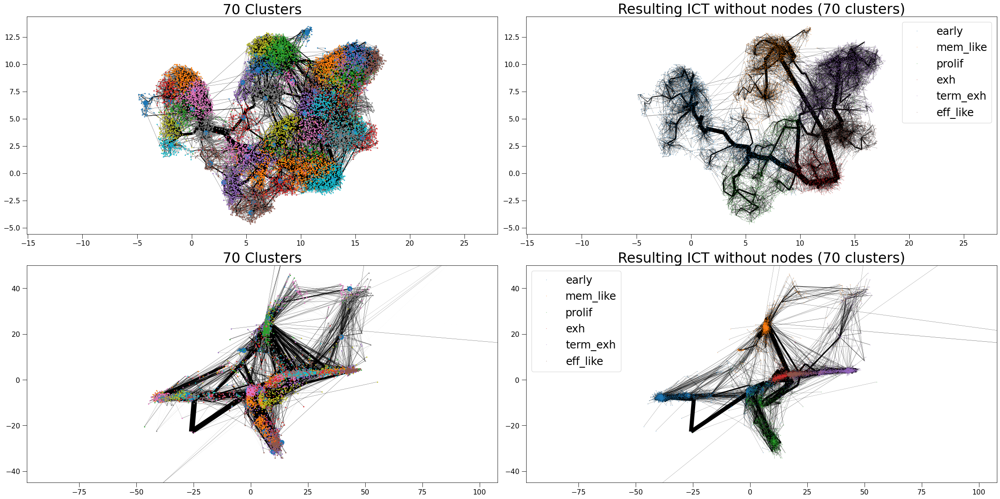

sklearn is done: 56.89755392074585
My own part is done: 1.4192399978637695
sklearn is done: 66.38671207427979
My own part is done: 1.833690881729126


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

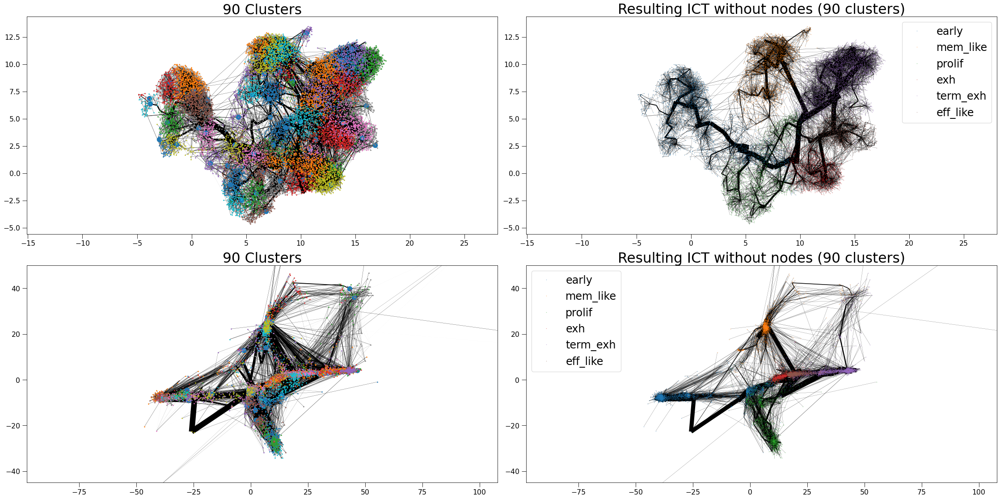

sklearn is done: 57.862019300460815
My own part is done: 1.4414019584655762
sklearn is done: 73.34553503990173
My own part is done: 3.007483720779419


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

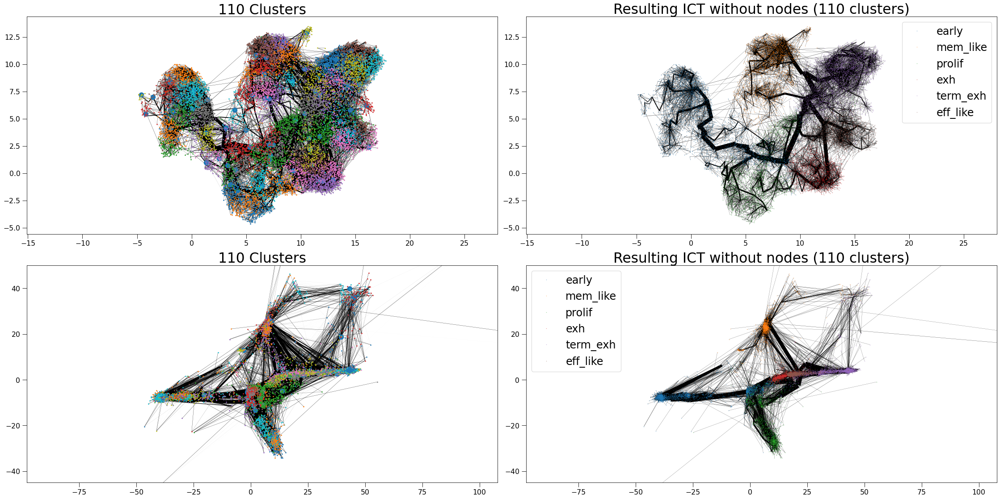

sklearn is done: 44.99173641204834
My own part is done: 2.651756525039673
sklearn is done: 55.0881929397583
My own part is done: 1.7471630573272705


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

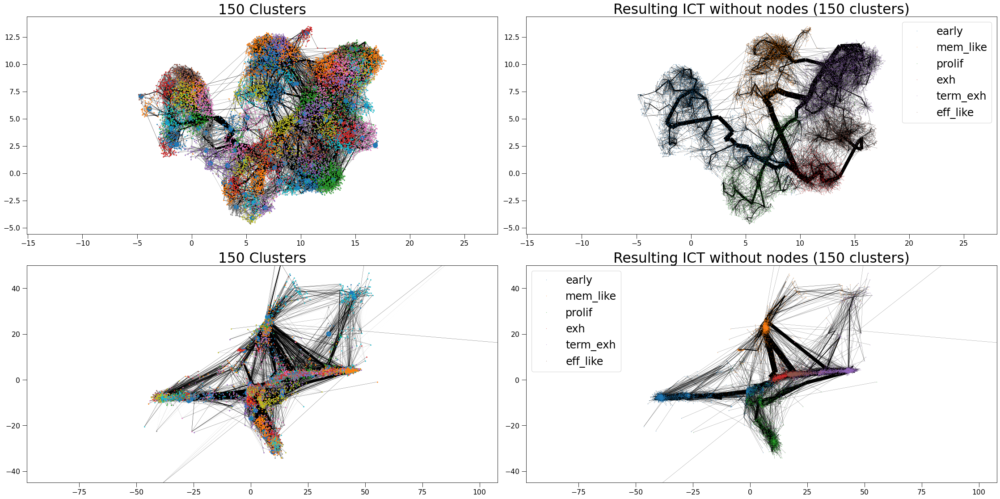

sklearn is done: 70.45065689086914
My own part is done: 3.462038278579712
sklearn is done: 57.73702359199524
My own part is done: 2.084846258163452


create edgeId array:   0%|          | 0/138063 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138063 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

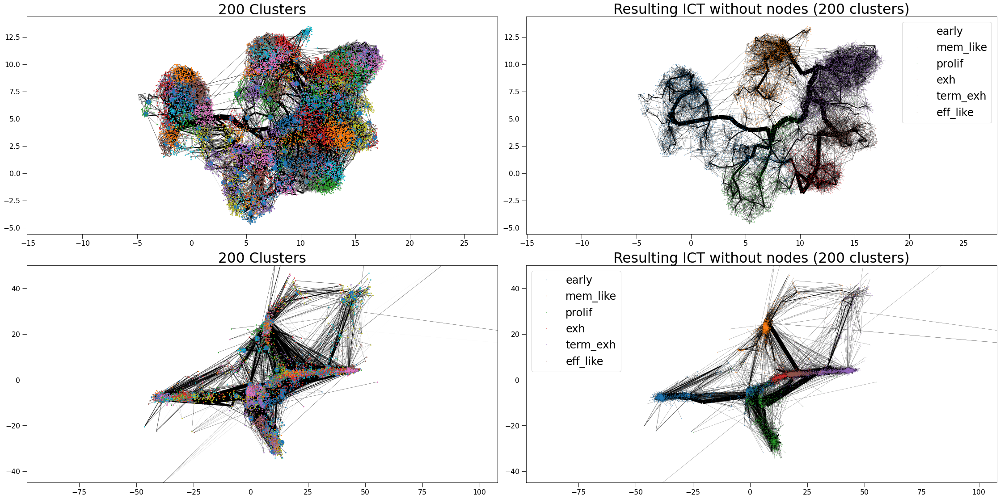

In [7]:
old_G, _ = create_graph(number_of_nodes, mode, position=pca, beta=2, delta=0.5)

for k in [30, 50, 70, 90, 110, 150, 200]:
    
    G = deepcopy(old_G)
    cluster_centers, cluster_labels = k_means_pp(k, pca, metric=metric, return_labels=True)

    cluster_centers, cluster_labels = cassign(cluster_centers, cluster_labels, pca, t=min_cluster_size)

    G = reweight_clusters(pca, G, cluster_centers, cluster_labels, min_scale = 0.3, max_scale=1.1)
    
    G.indexEdges()
    
    cluster_centers2 = centers(pca)
    
    ICT = calculate_ICT(G, algorithm_type=ICT_algorithm, cluster_centers=cluster_centers2, zeros_stay_zeros=True, update_G=1.1)
        
    ICT.indexEdges()
    
    # Plot the ICT
    fig, axs = plt.subplots(2, 2)
    
    plot_graph(G, embedding, f"", axs[0,0], node_size=0)
    plot_points(embedding[cluster_centers], f"", axs[0,0], node_size=20)
    plot_points(embedding, f"{k} Clusters", axs[0,0], labels=np.array(cluster_labels), node_size=3)
    axs[0,0].get_legend().remove()
    
    
    plot_points(embedding, f"", axs[0,1], labels=labels, node_size=0.5)
    plot_graph(ICT, embedding, f"Resulting ICT without nodes ({k} clusters)", axs[0,1], node_size=0)
    name = str(k)

    
    plot_graph(G, dtae_embedding, f"", axs[1,0], node_size=0)
    plot_points(dtae_embedding[cluster_centers], f"", axs[1,0], node_size=20)
    plot_points(dtae_embedding, f"{k} Clusters", axs[1,0], labels=np.array(cluster_labels), node_size=3)
    axs[1,0].get_legend().remove()
    
    
    plot_points(dtae_embedding, f"", axs[1,1], labels=dtae_labels, node_size=0.5)
    plot_graph(ICT, dtae_embedding, f"Resulting ICT without nodes ({k} clusters)", axs[1,1], node_size=0)
    name = str(k)
    
    
    axs[1,0].set_xlim([-50,60])
    axs[1,0].set_ylim([-45,50])
    axs[1,1].set_xlim([-50,60])
    axs[1,1].set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig(f"Output/ETH/pca/" + name.zfill(5) + ".png")
    plt.show()